# Zadanie 2
## Name: Jan Balucha
## Important methods:
<table>
    <tr>
        <td>cv2.imread</td>
        <td>cv2.cvtColor</td>
        <td>cv2.equalizeHist</td>
        <td>cv2.imshow</td>
    </tr>
    <tr>
        <td>cv2.merge</td>
        <td>cv2.LUT</td>
        <td>cv2.drawMatches</td>
        <td>cv2.dilate</td>
    </tr>
    <tr>
        <td>cv2.FlannBasedMatcher</td>
        <td>cv2.BFMatcher</td>
        <td>cv2.SIFT_create</td>
        <td>cv2.ORB_create</td>
    </tr>
    <tr>
        <td>cv2.polylines</td>
        <td>cv2.findHomography</td>
        <td>cv2.drawMatchesKnn</td>
        <td>cv2.drawKeypoints</td>
    </tr>
    <tr>
        <td>plt.imshow</td>
        <td>plt.ax.set_title</td>
        <td>plt.subplots</td>
        <td>plt.title</td>
    </tr>
    <tr>
        <td>np.average</td>
        <td>np.min</td>
        <td>np.max</td>
        <td>np.reshape</td>
    </tr>
    <tr>
        <td>np.float32</td>
        <td>np.ravel</td>
        <td>np.tolist</td>
        <td>np.reshape</td>
    </tr>
</table>

import libraries

In [1]:
import cv2
import numpy as np
import matplotlib
import os

from math import ceil
from matplotlib import pyplot as plt

from utils import show_histogram, equalize_comparision, show_best_equalizations

matplotlib.rcParams['figure.figsize'] = (13, 8)

list and reading of images in directory

In [2]:
NUCLEI_PATH = 'Data Povid 2 cviko/Histology nuclei/'
nuclei_files = os.listdir(NUCLEI_PATH)
nuclei_images = [cv2.imread(NUCLEI_PATH + file) for file in nuclei_files]

showing one of that image in RGB color space

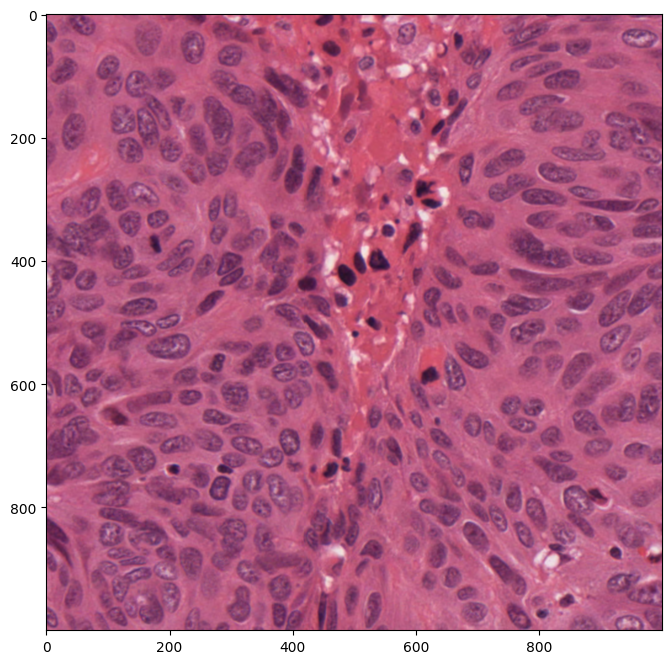

In [3]:
img = cv2.imread('Data Povid 2 cviko/Histology nuclei/TCGA-18-5592-01Z-00-DX1.tif')
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2.imwrite("assets/input_file.jpg", rgb_img)
plt.imshow(rgb_img, cmap='gray', interpolation='bicubic')

## Histogram visualization
In this section we will show histograms for image above in different color spaces. Function that plots histograms is defined in utils.py file.

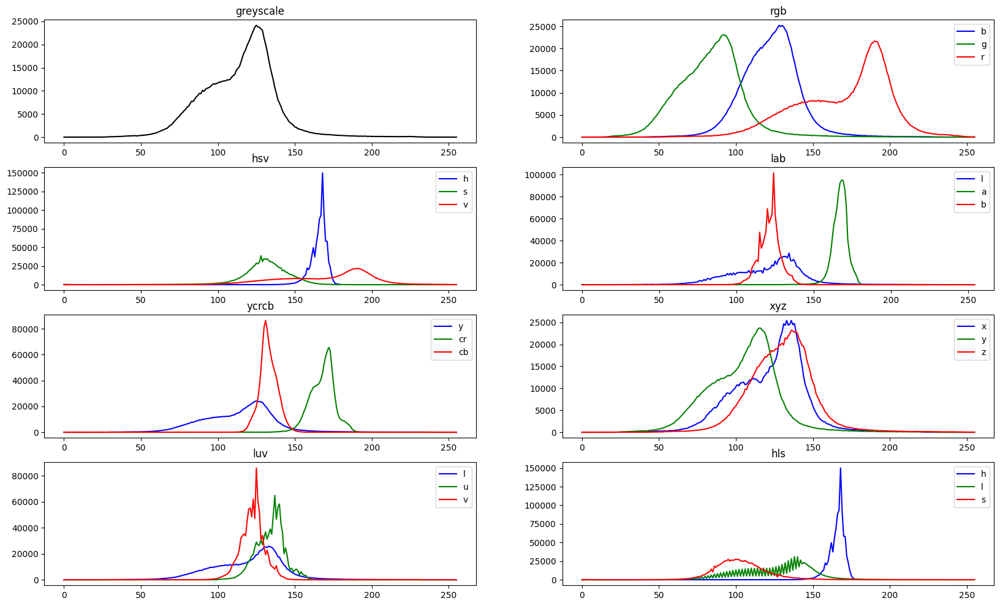

In [4]:
models = ["greyscale", "rgb", "hsv", "lab", "ycrcb", "xyz", "luv", "hls"]
hist = show_histogram(img, models)

## Histogram equalization

Here we will show how histogram equalization works on greyscale image. As we can see, the equalized image has more contrast, so it is easier to segment cells located on the image.

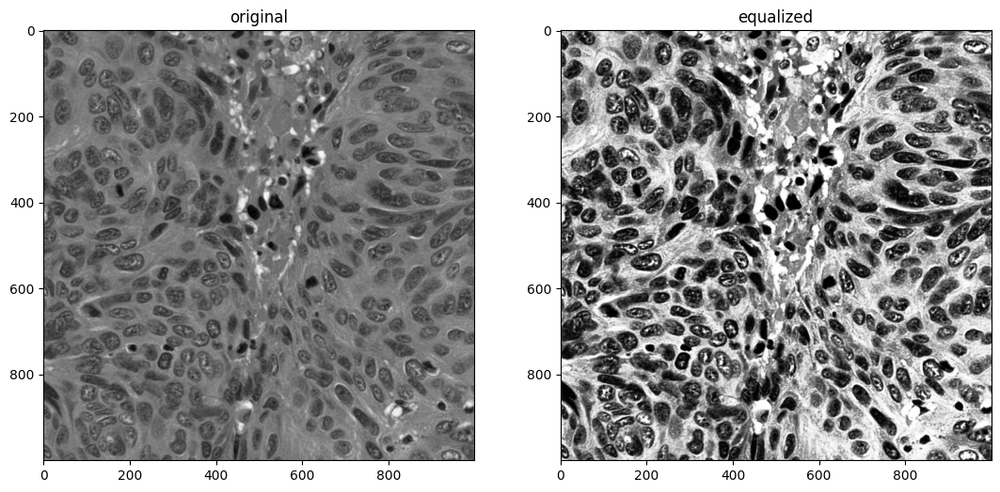

In [5]:
eq_gray = cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13,8))

axes[0].set_title("original")
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cmap='gray')

axes[1].set_title("equalized")
axes[1].imshow(eq_gray, cmap='gray')

Here we will show how histogram equalization modifies histogram on greyscale image. As we can see, the equalized histogram has changed its shape, the range of values is now more uniform.

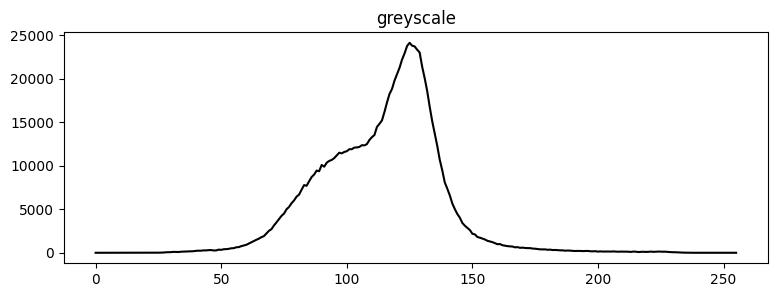

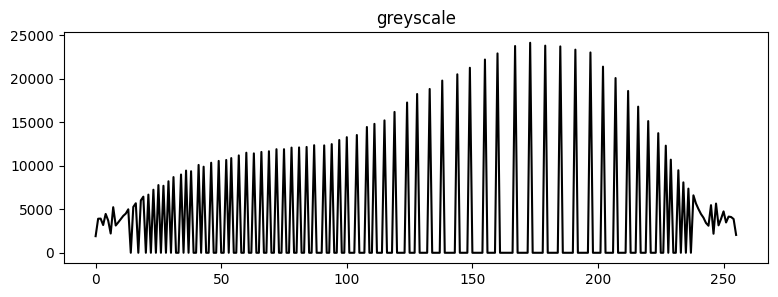

In [6]:
show_histogram(img, ["greyscale"])
show_histogram(cv2.cvtColor(eq_gray, cv2.COLOR_GRAY2BGR), ["greyscale"])

Here we will show how histogram equalization works on RGB image. From the image below we can see that the colors on the image are distorted, but the contrast is better.

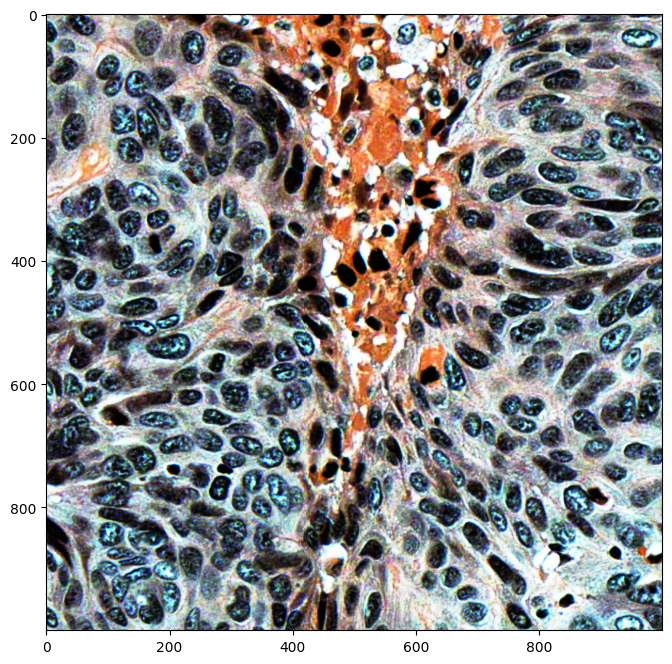

In [7]:
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
eq_r = cv2.equalizeHist(rgb_img[:,:,0])
eq_g = cv2.equalizeHist(rgb_img[:,:,1])
eq_b = cv2.equalizeHist(rgb_img[:,:,2])
eq_rgb = cv2.merge((eq_r, eq_g, eq_b))
plt.imshow(eq_rgb)

Here we can see equalization modifies histogram on RGB image

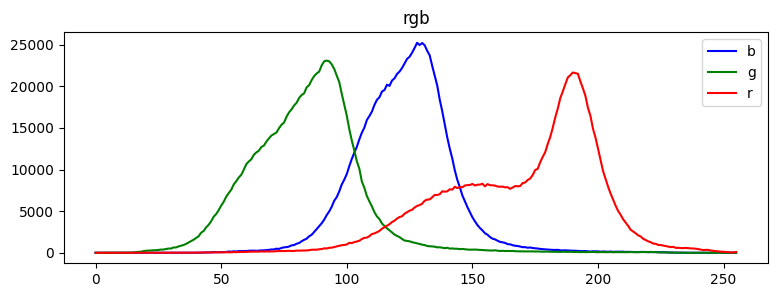

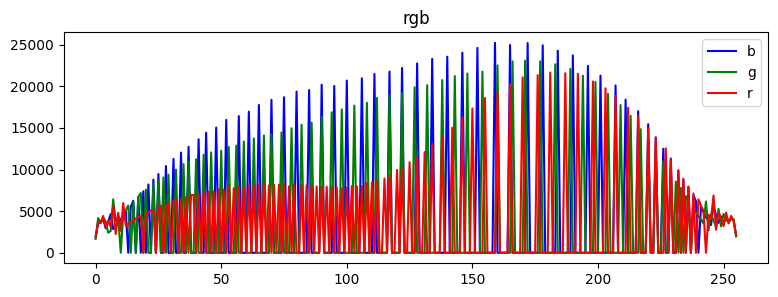

In [8]:
show_histogram(img, ["rgb"])
show_histogram(cv2.cvtColor(eq_rgb, cv2.COLOR_RGB2BGR), ["rgb"])

Lets see if we can achieve better results by equalizing in different color spaces. We will use the same method as in the previous section, but we will use different color spaces. We have experimented with different types of equalization. In the jupyter notebook equalize_comparision.ipynb we have equalized single channel, but showed image with all channels. In jupyter notebook equalize_comparision_gray we have have picked one channel, equalized it and showed only this channel. More information about these experiments can be found in respective jupyter notebooks.

In [9]:
# show_best_equalizations(nuclei_images.copy())

## Gamma correction


Using gamma correction we can change the brightness of the image. Using opencv we can do so by using lookup table. First we calculate inverse gamma and then we create a lookup table. Then we use cv2.LUT function to apply the lookup table to the image.

In the example below we can see that the image with gamma 1.5 is brighter and the image with gamma 0.7 is darker.

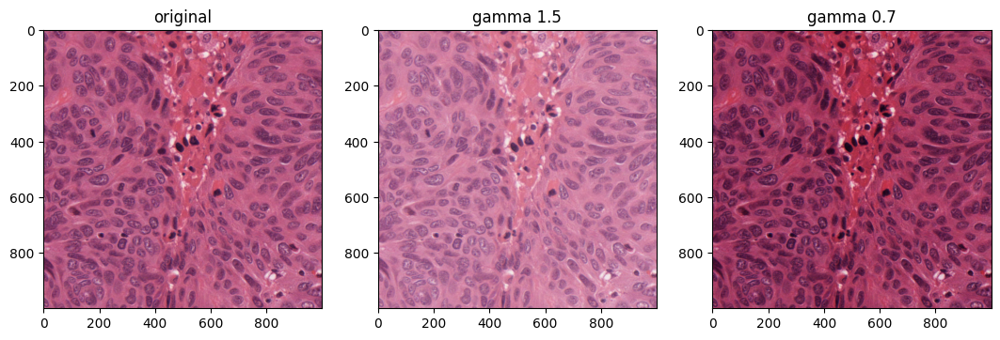

In [10]:
def gamma_correction(img, gamma):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(13,8))
axes[0].set_title("original")
axes[0].imshow(rgb_img)
axes[1].set_title("gamma 1.5")
axes[1].imshow(gamma_correction(rgb_img, 1.5))
axes[2].set_title("gamma 0.7")
axes[2].imshow(gamma_correction(rgb_img, 0.7))

## Segmentation using LAB color space

Firstly we load the image and convert it to float32 for more precise calculations. Then we convert it to LAB color space. We can see that the range of values for each channel is different.

min:7.928466796875, max:94.232177734375
min:0.65625, max:59.234375
min:-45.125, max:26.953125


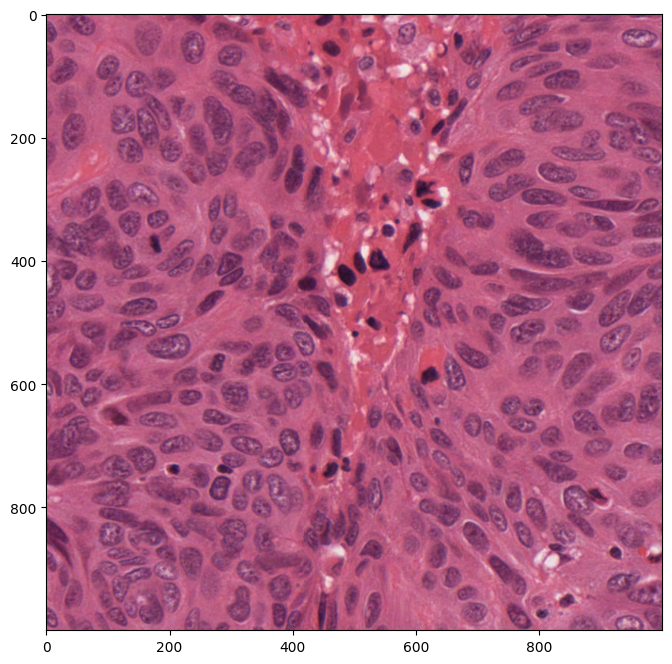

In [11]:
img_full_range = cv2.imread('Data Povid 2 cviko/Histology nuclei/TCGA-18-5592-01Z-00-DX1.tif', flags=cv2.IMREAD_ANYDEPTH)
img_lab_full_range = cv2.cvtColor(img.astype(np.float32) / 255, cv2.COLOR_BGR2Lab)


for i in range(3):
    print(f"min:{np.min(img_lab_full_range[:,:,i])}, max:{np.max(img_lab_full_range[:,:,i])}")
plt.imshow(cv2.cvtColor(img_lab_full_range, cv2.COLOR_LAB2RGB))

Then we select a nucleus pixels from the image

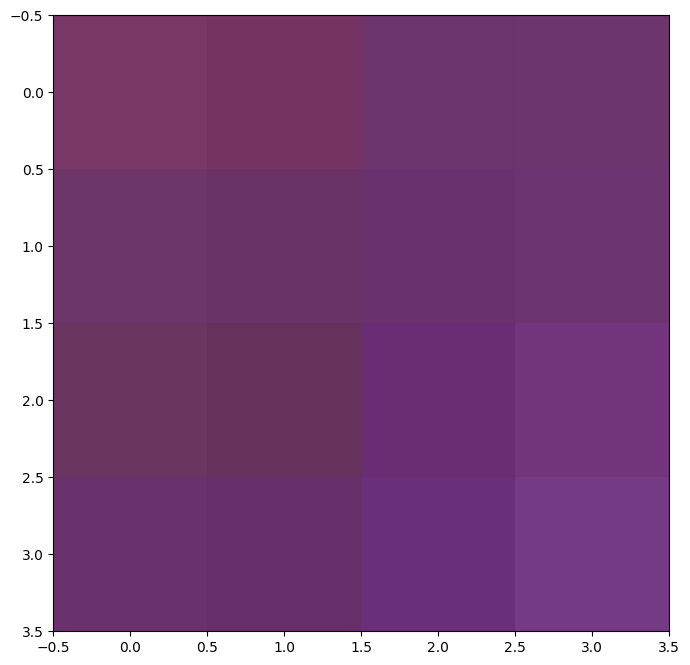

In [12]:
x = 289
y = 311
w = 4
h = 4

nucleus = img_lab_full_range[y:y+h, x:x+w, :]

plt.imshow(cv2.cvtColor(nucleus, cv2.COLOR_LAB2RGB))

We calculate the average values for each channel of nucleus pixels. Then we extracted that average value from corresponding channel of the image for each of 3 channels. Then we calculated the euclidean distance between the nucleus and the image. The result is shown below.

Nucleus_avg_L: 31.503296 
Nucleus_avg_a: 35.007812 
Nucleus_avg_b: -22.245117


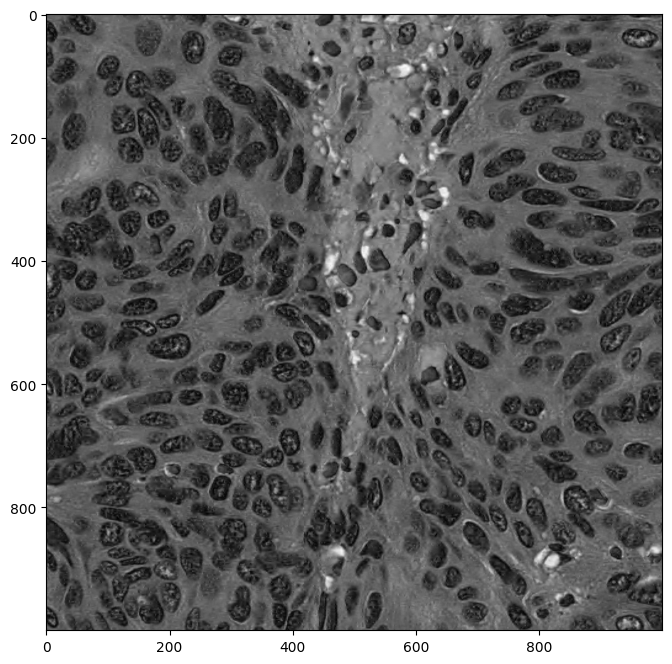

In [13]:
nucleus_avg_l = np.average(nucleus[:, :, 0])
nucleus_avg_a = np.average(nucleus[:, :, 1])
nucleus_avg_b = np.average(nucleus[:, :, 2])

print("Nucleus_avg_L:", nucleus_avg_l, "\nNucleus_avg_a:", nucleus_avg_a, "\nNucleus_avg_b:", nucleus_avg_b)


delta_l = img_lab_full_range[:, :, 0] - nucleus_avg_l
delta_a = img_lab_full_range[:, :, 1] - nucleus_avg_a
delta_b = img_lab_full_range[:, :, 2] - nucleus_avg_b

dst = np.sqrt(np.square(delta_l) + np.square(delta_a) + np.square(delta_b))

plt.imshow(dst, cmap='gray')

Then we used thresholding on the result to get the mask of the nucleus. The value 20 for thresholding was chosen experimentally. As we wanted to select only the nucleus, we used inverse thresholding. The result is shown below. We can see that the mask is not perfect, selecting better pixels for the nucleus would improve the result.

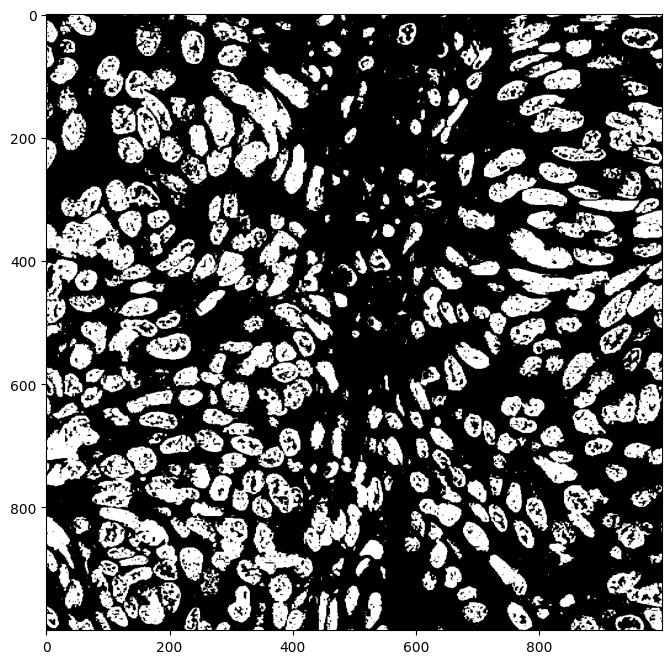

In [14]:
_, thresh = cv2.threshold(src=dst, thresh=20, maxval=255, type=cv2.THRESH_BINARY_INV)

plt.imshow(thresh, cmap='gray')

## Descriptors and matching

First we load out loookup image and 3 patches. We convert them to grayscale and then to RGB. We will use RGB images for visualization and grayscale images for calculations.

In [2]:
lookup = cv2.cvtColor(cv2.imread('local_descriptors_task/lookup.tif'), cv2.COLOR_BGR2RGB)
lookup_gray = cv2.cvtColor(lookup, cv2.COLOR_RGB2GRAY)
patch1 = cv2.cvtColor(cv2.imread('local_descriptors_task/patch1.tif'), cv2.COLOR_BGR2RGB)
patch1_gray = cv2.cvtColor(patch1, cv2.COLOR_RGB2GRAY)
patch2 = cv2.cvtColor(cv2.imread('local_descriptors_task/patch2.tif'), cv2.COLOR_BGR2RGB)
patch2_gray = cv2.cvtColor(patch2, cv2.COLOR_RGB2GRAY)
patch3 = cv2.cvtColor(cv2.imread('local_descriptors_task/patch3.tif'), cv2.COLOR_BGR2RGB)
patch3_gray = cv2.cvtColor(patch3, cv2.COLOR_RGB2GRAY)
patches = [patch1, patch2, patch3]

Then we import our function for feature detection and description. We will use Harris, FAST, SIFT for feature detection and SIFT and ORB for feature description. These function can be found in localizator_utils.py file.

In [3]:
from localizator_utils import get_haris_kp_img, get_fast_kp_img, get_sift_kp_img, get_orb_kp_img, compute_sift_des, compute_orb_des

Here we can see comparision of feature detection algorithms on our lookup image as well as on patch.

Text(0.5, 0.98, 'Feature detector comparision')

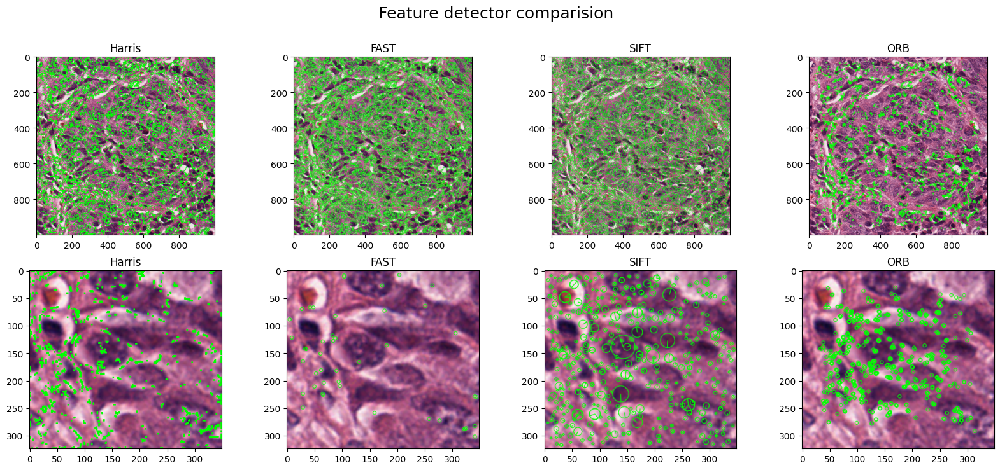

In [17]:
images = [lookup, patch1]
fig, axes = plt.subplots(nrows=len(images), ncols=4, figsize=(4*5, len(images)*4))
for i, row in zip(range(len(images)), axes):

    kp_harris, img_haris = get_haris_kp_img(images[i])
    axes[i][0].set_title("Harris")
    axes[i][0].imshow(img_haris)

    kp_fast, img_fast = get_fast_kp_img(images[i], threshold=25)
    axes[i][1].set_title("FAST")
    axes[i][1].imshow(img_fast)

    kp_sift, img_sift = get_sift_kp_img(images[i])
    axes[i][2].set_title("SIFT")
    axes[i][2].imshow(img_sift)

    kp_orb, img_orb = get_orb_kp_img(images[i], nfeatures=10000)
    axes[i][3].set_title("ORB")
    axes[i][3].imshow(img_orb)
fig.suptitle("Feature detector comparision", fontsize=18)

For matching we will be using Brute-Force and Flann matcher. These matchers are implemented in localizator_utils.py file.

In [4]:
from localizator_utils import knn_matcher, flann_matcher

In this section we will be comparing different combinations of feature detection and description algorithms. We will be using Brute force KNN and Flann matcher for each combination of feature detection and description

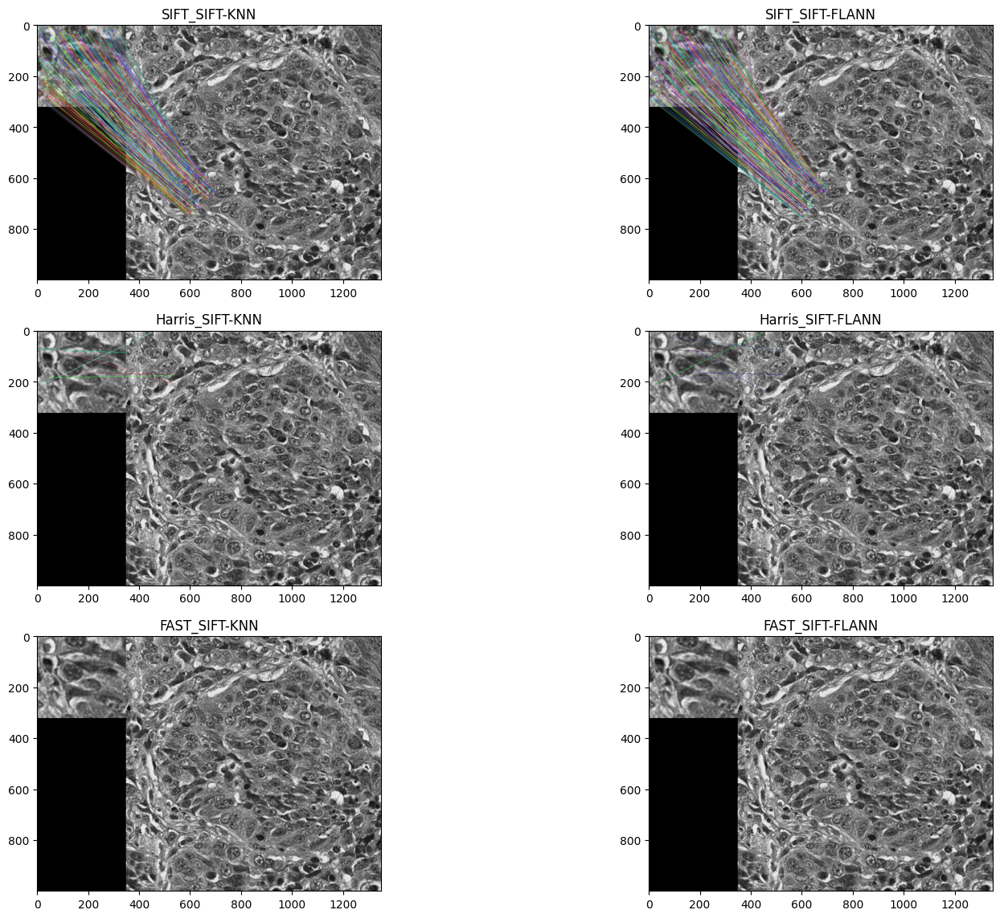

In [11]:
combinations = [
    ('SIFT_SIFT', (get_sift_kp_img, compute_sift_des)),
    ('Harris_SIFT', (get_haris_kp_img, compute_sift_des)),
    ('FAST_SIFT', (get_fast_kp_img, compute_sift_des)),
]

matchers = [('KNN', knn_matcher), ('FLANN', flann_matcher)]
kp_des_combinations = {}

fig, axes = plt.subplots(nrows=len(combinations), ncols=len(matchers), figsize=(18, 14))

for comb, ax in zip(combinations, axes):
    name, functions = comb
    kp_function, des_function = functions

    kp_lookup, _ = kp_function(lookup)
    kp_patch, _ = kp_function(patch1)
    des_lookup = des_function(lookup_gray, kp_lookup)
    des_patch = des_function(patch1_gray, kp_patch)

    for matcher, col in zip(matchers, ax):
        matcher_name, matcher_fn = matcher
        good = matcher_fn(des_lookup, des_patch)
        col.set_title(name+"-"+matcher_name)
        col.imshow(cv2.drawMatchesKnn(patch1_gray, kp_patch, lookup_gray, kp_lookup, good, None, flags=2))

### Homography matrix

First, we will be using SIFT-SIFT combination for feature detection and description. We will be using Flann matcher for matching.

In [20]:
kp_lookup, _ = get_sift_kp_img(lookup)
kp_patch, _ = get_sift_kp_img(patch1)
des_lookup = compute_sift_des(lookup_gray, kp_lookup)
des_patch = compute_sift_des(patch1_gray, kp_patch)
good = np.reshape(flann_matcher(des_lookup, des_patch), (-1))

From good matches we will be extracting source and destination points. These points will be used to find homography matrix.

In [21]:
src_pts = np.float32([kp_patch[m.queryIdx].pt for m in good])
dst_pts = np.float32([kp_lookup[m.trainIdx].pt for m in good])

Then we will be using RANSAC (random sample consensus) algorithm to find homography matrix. We will be using value _5.0_ as threshold for RANSAC. Finally we convert mask to list.

In [22]:
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
matchesMask = mask.ravel().tolist()

Then we select border points of patch and transform them using perspectiveTransform function. We will be using this points to draw polygon on lookup image.

In [23]:
h,w = patch1_gray.shape
pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)

Finally we draw polygon on lookup image. We will be using _cv2.polylines_ function for this purpose. We will be using _cv2.LINE_AA_ as line type. For border color we selected _white(255 in grayscale)_ and thickness _3_. We plot this image along with patch image.

Text(0.5, 1.0, 'Patch')

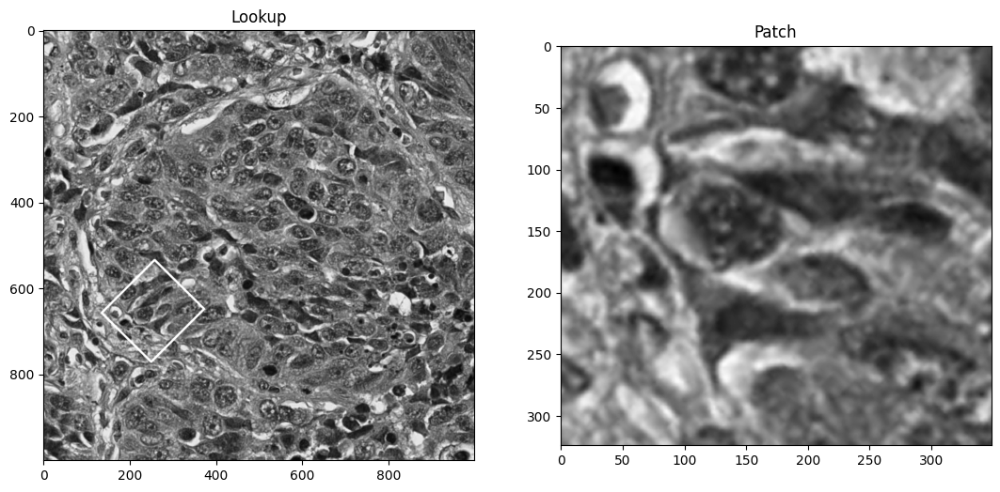

In [24]:
img2 = cv2.polylines(lookup_gray,[np.int32(dst)],True,255,3, cv2.LINE_AA)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13, 10))
axes[0].imshow(img2, 'gray')
axes[0].set_title("Lookup")
axes[1].imshow(patch1_gray, 'gray')
axes[1].set_title("Patch")

In final step we draw matches on lookup image with patch border. We will be using _cv2.drawMatchesKnn_ function for this purpose. As flags we will be using _cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS_ (represented as value 2).

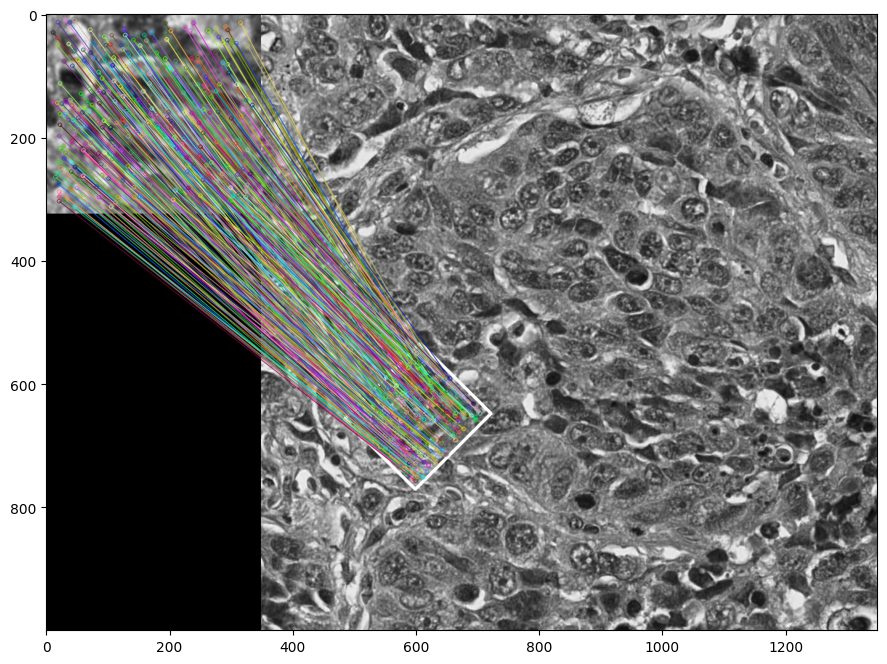

In [25]:
img3 = cv2.drawMatches(patch1_gray,kp_patch,img2,kp_lookup,good,None,flags=2)
plt.imshow(img3, 'gray')